# Traces for the previous choice datan
Here we use the components extracted in the previous step and the timestamped data from the behavior

In [44]:
# Load the libraries
import caiman as cm
from caiman.source_extraction import cnmf

import matplotlib.pyplot as plt
from matplotlib.widgets import Button, TextBox
from matplotlib.patches import Polygon
from matplotlib.path import Path
import matplotlib.gridspec as gridspec
from matplotlib.widgets import CheckButtons

import numpy as np
import pandas as pd
import json
from scipy.sparse import csc_matrix
from scipy.stats import sem

from IPython import get_ipython
import IPython

from ipyfilechooser import FileChooser

from scipy.ndimage import binary_erosion

try:
    if __IPYTHON__:
        get_ipython().run_line_magic('load_ext', 'autoreload')
        get_ipython().run_line_magic('autoreload', '2')
except NameError:
    pass

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Load the data

In [19]:
# Load the data
path = 'D:/CaIm/os66y/'

neu_path = path + 'good_neu_traces.csv'

neu_traces = pd.read_csv(neu_path)
neu_traces = neu_traces.to_numpy()

,0,1,2,3,4,5,6,7,8,9,...,12635,12636,12637,12638,12639,12640,12641,12642,12643,12644
0,26.776185,-25.292972,-72.434704,-115.115293,-153.756920,-188.741800,-220.415981,-249.092755,-77.749058,194.263742,...,-468.125298,-473.360741,-478.100732,-482.392175,-486.277520,-489.795190,-186.135172,-218.056010,-246.956128,-273.121351
1,-289.030831,-299.754464,-309.630533,-318.726053,-327.102732,-334.817332,-341.922251,-348.465586,-354.491801,-360.041759,...,173.021154,331.336405,329.280741,269.689186,214.807410,212.230566,261.828224,207.567725,157.595677,111.573215
2,267.798654,205.335594,147.226201,93.167018,42.875734,-3.910257,-47.435278,-87.926623,-125.595730,-160.639303,...,-542.257465,-548.259845,-553.843830,-559.038654,-563.871418,-568.367268,-572.549824,-576.440816,-580.060628,-583.428182
3,-229.779667,25.215758,-33.192685,-86.790170,-135.972979,-181.104709,-222.519047,-260.522191,-295.395117,-327.395606,...,52.735292,154.075442,85.053102,139.711673,209.419560,135.838626,68.318422,226.555607,151.563235,82.747865
4,62.591307,188.333124,128.109982,71.990766,19.695871,121.899044,66.203070,14.302490,-34.061259,-79.129263,...,-129.942013,-168.476130,-204.384332,-237.845544,-269.026542,-13.411987,-59.887144,114.837704,59.622923,8.170776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,1465.059544,1934.214481,2125.596818,2249.039697,2064.487927,1934.684696,1847.361204,1710.755971,1568.267070,1500.852637,...,105.461036,67.748570,33.222597,1.613831,-27.324159,-53.817142,-78.071599,-100.276740,-120.605660,-139.216928
94,-85.005889,154.415083,284.989316,224.861463,537.965388,997.525870,1251.271229,1702.289779,1808.214705,1613.954819,...,-69.214019,-98.151458,-124.540740,-43.667358,-74.854400,40.509460,1.910004,103.760924,59.591674,19.311859
95,605.481421,573.923741,532.118990,503.972962,467.242125,491.764709,455.919400,449.391721,502.407532,465.790220,...,-0.768782,-0.888109,-0.998781,-1.101425,-1.196624,-1.284918,-1.366807,-1.442756,-1.513197,-1.578528
96,387.804046,364.107362,341.842288,382.695129,359.307100,337.332004,403.019621,381.967682,358.623598,357.508089,...,-1.234682,-1.428244,-1.610113,-1.780995,-1.941553,-2.092411,-2.234156,-2.367337,-2.492472,-2.610047


In [38]:
neu_traces = neu_traces.to_numpy()
neu_traces

array([[  26.7761854 ,  -25.2929719 ,  -72.43470358, ..., -218.05601049,
        -246.95612787, -273.12135133],
       [-289.03083115, -299.75446427, -309.63053267, ...,  207.56772453,
         157.59567718,  111.57321491],
       [ 267.79865416,  205.33559355,  147.22620131, ..., -576.44081557,
        -580.0606277 , -583.42818153],
       ...,
       [ 605.48142137,  573.92374121,  532.11899012, ...,   -1.44275626,
          -1.51319656,   -1.57852755],
       [ 387.80404591,  364.10736203,  341.84228814, ...,   -2.36733656,
          -2.49247197,   -2.61004713],
       [-118.10594207,  -43.93016063,   48.00259793, ...,   79.01766988,
          51.56970228,   26.29614264]])

In [13]:
# Load event times
# Create and display a FileChooser widget
fc = FileChooser('D:/behav/')
fc.filter_pattern = '*.csv'
fc.use_dir_icons = True
display(fc)

FileChooser(path='D:\behav', filename='', title='', show_hidden=False, select_desc='Select', change_desc='Chan…

In [24]:
file_path = fc.selected_path + '\\' + fc.selected_filename
data = pd.read_csv(file_path)
data_licks_L = pd.read_csv(file_path[0:-4] + '_t_licks_L.csv', header = None)
data_licks_R = pd.read_csv(file_path[0:-4] + '_t_licks_R.csv', header = None)

#data = data[data['laser_stim_ts']!=0]
#data['end_trial'] = data['laser_stim_ts'].shift(-1) 
#data['end_trial'].fillna( data['laser_stim_ts'][data.shape[0]-1] + 6000, inplace=True)


In [27]:
data['tone_ts'][0]

664

In [29]:
if data['tone_ts'][1] < 0:
    data['tone_ts'] = [ -x for x in data['tone_ts'] ]
data

,missed,laser,side,tone_ts,choice_made
0,0,1,-1,664,-1
1,1,2,-1,4097,1
2,0,0,-1,8040,-1
3,1,0,1,12587,1
4,0,2,-1,16612,1
...,...,...,...,...,...
268,1,0,1,1101603,1
269,1,0,1,1105578,1
270,1,0,-1,1109487,1
271,1,0,1,1113397,1


In [40]:
neuron_traces = neu_traces

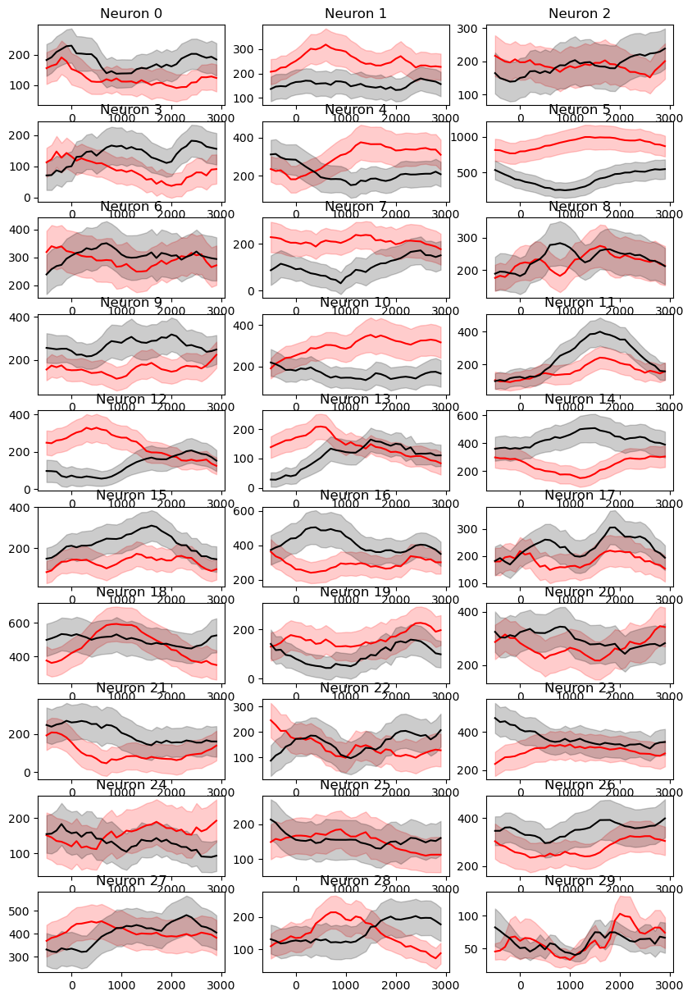

In [42]:


# Example DataFrames
# neuron_traces = pd.DataFrame(...)  # Your neuron traces data
# data = pd.DataFrame(...)  # Your laser event data

# Sample neuron to plot
#neuron_id = 2  # Adjust this based on the neuron you want to plot

# Time conversion
sampling_rate = 10  # Hz
pre_event_points = 500 // (1000 / sampling_rate)  # 500 ms before
post_event_points = 3000 // (1000 / sampling_rate)  # 3000 ms after

# Function to extract data around laser event
def extract_data(side, n_id):
    times = data[data['side'] == side]['tone_ts']
    indices = (times * sampling_rate / 1000).astype(int)
    traces = []
    for idx in indices:
        start = int(idx - pre_event_points)
        end = int( idx + post_event_points)
        if start > 500 & end < neuron_traces.shape[1]-1:
            trace = neuron_traces[n_id, start:end]
            if trace.shape[0] == pre_event_points + post_event_points:
                traces.append(trace)
    return np.array(traces)


def plot_neu(neuron_id, ax_n):
    for i in [0,1,2]:
        # Extract data for each laser type
        traces_1 = extract_data(1, neuron_id+i)

        traces_0 = extract_data(-1, neuron_id+i)
        # Mean and std
        mean_trace_1 = np.mean(traces_1, axis=0)
        std_trace_1 = sem(traces_1, axis=0)

        mean_trace_0 = np.mean(traces_0, axis=0)
        std_trace_0 = sem(traces_0, axis=0)
        # Laser = 1
        axs[ax_n,i].plot(time_points, mean_trace_1, color='r', label='Mean')
        axs[ax_n,i].fill_between(time_points, mean_trace_1 - std_trace_1, mean_trace_1 + std_trace_1, color='r', alpha=0.2)

        # Laser = 0
        axs[ax_n,i].plot(time_points, mean_trace_0, color='k', label='Mean')
        axs[ax_n,i].fill_between(time_points, mean_trace_0 - std_trace_0, mean_trace_0 + std_trace_0, color='k', alpha=0.2)
        axs[ax_n,i].set_title('Neuron '+ str(neuron_id+i))



# Time points for x-axis
time_points = np.arange(-pre_event_points, post_event_points) * (1000 / sampling_rate)

# Plotting
fig, axs = plt.subplots(10, 3, figsize=(10, 15))
neu_indx = np.arange(0,30,3)
for n in np.arange(len(neu_indx)):
    plot_neu(neu_indx[n], n)


plt.show()






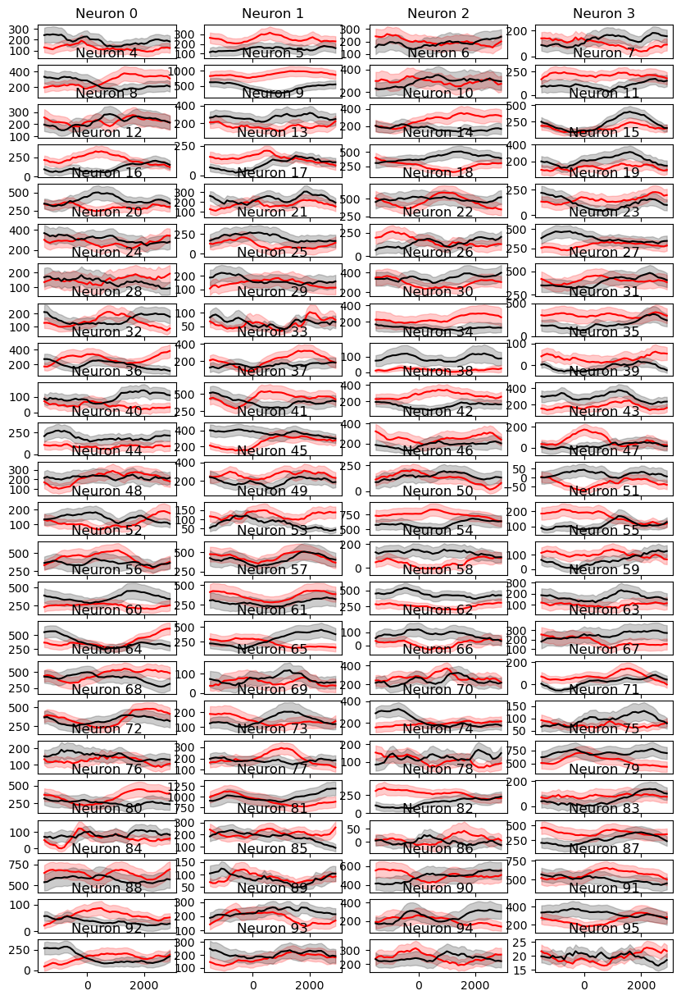

In [43]:


# Example DataFrames
# neuron_traces = pd.DataFrame(...)  # Your neuron traces data
# data = pd.DataFrame(...)  # Your laser event data

# Sample neuron to plot
#neuron_id = 2  # Adjust this based on the neuron you want to plot

# Time conversion
sampling_rate = 10  # Hz
pre_event_points = 100 // (1000 / sampling_rate)  # 500 ms before
post_event_points = 4000 // (1000 / sampling_rate)  # 3000 ms after

# Function to extract data around laser event
def extract_data(side, n_id):
    times = data[data['side'] == side]['tone_ts']
    indices = (times * sampling_rate / 1000).astype(int)
    traces = []
    for idx in indices:
        start = int(idx - pre_event_points)
        end = int( idx + post_event_points)
        if start > 500 & end < neuron_traces.shape[1]-1:
            trace = neuron_traces[n_id, start:end]
            if trace.shape[0] == pre_event_points + post_event_points:
                traces.append(trace)
    return np.array(traces)


def plot_neu(neuron_id, ax_n, cols):
    for i in np.arange(cols):
        if neuron_id+i>=neuron_traces.shape[0]:
            break
        # Extract data for each laser type
        traces_1 = extract_data(1, neuron_id+i)

        traces_0 = extract_data(-1, neuron_id+i)
        # Mean and std
        mean_trace_1 = np.mean(traces_1, axis=0)
        std_trace_1 = sem(traces_1, axis=0)

        mean_trace_0 = np.mean(traces_0, axis=0)
        std_trace_0 = sem(traces_0, axis=0)
        # Laser = 1
        axs[ax_n,i].plot(time_points, mean_trace_1, color='r', label='Mean')
        axs[ax_n,i].fill_between(time_points, mean_trace_1 - std_trace_1, mean_trace_1 + std_trace_1, color='r', alpha=0.2)

        # Laser = 0
        axs[ax_n,i].plot(time_points, mean_trace_0, color='k', label='Mean')
        axs[ax_n,i].fill_between(time_points, mean_trace_0 - std_trace_0, mean_trace_0 + std_trace_0, color='k', alpha=0.2)
        axs[ax_n,i].set_title('Neuron '+ str(neuron_id+i))



# Time points for x-axis
time_points = np.arange(-pre_event_points, post_event_points) * (1000 / sampling_rate)

# Plotting
cols = 4
fig, axs = plt.subplots(24, cols, figsize=(10, 15))

neu_indx = np.arange(0,96,cols)
for n in np.arange(len(neu_indx)):
    plot_neu(neu_indx[n], n, cols)

plt.show()

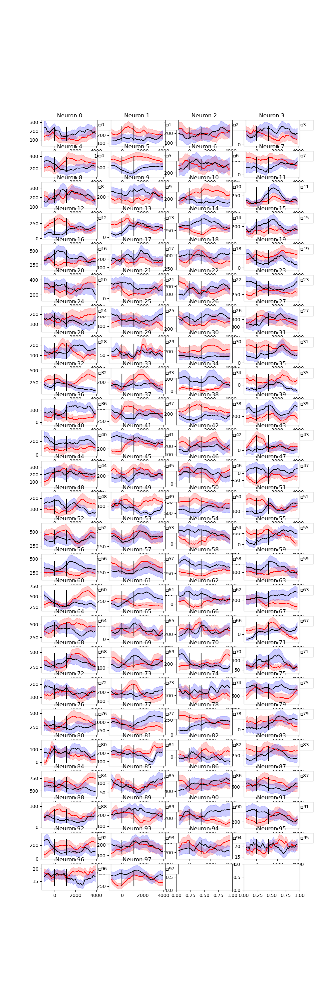

In [80]:

%matplotlib widget
# Example DataFrames
# neuron_traces = pd.DataFrame(...)  # Your neuron traces data
# data = pd.DataFrame(...)  # Your laser event data

# Sample neuron to plot
#neuron_id = 2  # Adjust this based on the neuron you want to plot

# Time conversion
sampling_rate = 10  # Hz
pre_event_points = 1000 // (1000 / sampling_rate)  # 500 ms before
post_event_points = 4000 // (1000 / sampling_rate)  # 3000 ms after

# Function to extract data around laser event
def extract_data(side, n_id):
    times = data[data['side'] == side]['tone_ts']
    indices = (times * sampling_rate / 1000).astype(int)
    traces = []
    for idx in indices:
        start = int(idx - pre_event_points)
        end = int( idx + post_event_points)
        if start > 500 & end < neuron_traces.shape[1]-1:
            trace = neuron_traces[n_id, start:end]
            if trace.shape[0] == pre_event_points + post_event_points:
                traces.append(trace)
    return np.array(traces)


def plot_neu(neuron_id, ax_n, cols):
    for i in np.arange(cols):
        if neuron_id+i>=neuron_traces.shape[0]:
            break
        # Extract data for each laser type
        traces_1 = extract_data(1, neuron_id+i)

        traces_0 = extract_data(-1, neuron_id+i)
        # Mean and std
        mean_trace_1 = np.mean(traces_1, axis=0)
        std_trace_1 = sem(traces_1, axis=0)

        mean_trace_0 = np.mean(traces_0, axis=0)
        std_trace_0 = sem(traces_0, axis=0)
        # Laser = 1
        axs[ax_n,i].plot(time_points, mean_trace_1, color='r', label='Mean')
        axs[ax_n,i].fill_between(time_points, mean_trace_1 - std_trace_1, mean_trace_1 + std_trace_1, color='r', alpha=0.2)

        # Laser = 0
        axs[ax_n,i].plot(time_points, mean_trace_0, color='b', label='Mean')
        axs[ax_n,i].fill_between(time_points, mean_trace_0 - std_trace_0, mean_trace_0 + std_trace_0, color='b', alpha=0.2)
        axs[ax_n,i].set_title('Neuron '+ str(neuron_id+i))

        # Lines at start tone, start response
        min_v = np.amin([np.amin(mean_trace_1), np.amin(mean_trace_0)])
        max_v = np.amax([np.amax(mean_trace_1), np.amax(mean_trace_0)])
        maxes = [np.amin(mean_trace_1), np.amax(mean_trace_1)]
        axs[ax_n,i].plot([0,0], [min_v, max_v], color='k', label='tone')
        axs[ax_n,i].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')

        # Create a small axis for the checkbox next to each subplot
        bbox = axs[ax_n, i].get_position()

        ax_check = fig.add_axes([bbox.xmax, bbox.ymax-0.01, 0.04, 0.01])
        
        checkbox = CheckButtons(ax_check, [str(neuron_id+i)], [False])
        checkbox_axes.append(checkbox)



# Time points for x-axis
time_points = np.arange(-pre_event_points, post_event_points) * (1000 / sampling_rate)





# Plotting
cols = 4
fig, axs = plt.subplots(25, cols, figsize=(10, 30))

checkbox_axes = []

neu_indx = np.arange(0,97,cols)
for n in np.arange(len(neu_indx)):
    plot_neu(neu_indx[n], n, cols)
    


plt.show()

relevant_neu = []

def check_handler(label):
    neuron_id = int(label)
    if neuron_id in relevant_neu:
        relevant_neu.remove(neuron_id)
    else:
        relevant_neu.append(neuron_id)

# Attach the handler to each checkbox
for check in checkbox_axes:
    check.on_clicked(check_handler)

In [108]:
relevant_neu = []

# Attach the handler to each checkbox
n = 0
for check in checkbox_axes:
    if check.get_status()==[True]:
        relevant_neu.append(n)
    n+=1


In [109]:
len(relevant_neu)

53

# For each side, select prev_same and prev_diff

In [107]:
#data['prev_same'] = 
prev_same=[data['side'][n]==data['side'][n-1] for n in np.arange(1,data.shape[0])]

start=[False]
start.extend(prev_same)
prev_same = start
data['prev_same'] = prev_same
data.head()

,missed,laser,side,tone_ts,choice_made,prev_same
0,0,1,-1,664,-1,False
1,1,2,-1,4097,1,True
2,0,0,-1,8040,-1,True
3,1,0,1,12587,1,False
4,0,2,-1,16612,1,False


# Plot prev same and prev diff for the left side and right sides

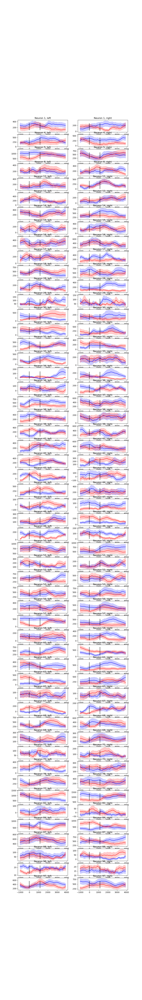

In [117]:


# Example DataFrames
# neuron_traces = pd.DataFrame(...)  # Your neuron traces data
# data = pd.DataFrame(...)  # Your laser event data

# Sample neuron to plot
#neuron_id = 2  # Adjust this based on the neuron you want to plot

# Time conversion
sampling_rate = 10  # Hz
pre_event_points = 1000 // (1000 / sampling_rate)  # 500 ms before
post_event_points = 4000 // (1000 / sampling_rate)  # 3000 ms after

# Function to extract data around laser event
def extract_data(side, prev_same, n_id):
    times = data[(data['side'] == side) & (data['prev_same'] == prev_same)]['tone_ts']
    indices = (times * sampling_rate / 1000).astype(int)
    traces = []
    for idx in indices:
        start = int(idx - pre_event_points)
        end = int( idx + post_event_points)
        if start > 500 & end < neuron_traces.shape[1]-1:
            trace = neuron_traces[n_id, start:end]
            if trace.shape[0] == pre_event_points + post_event_points:
                traces.append(trace)
    return np.array(traces)


def plot_neu(neuron_id, ax_n):
    # Left side
    side = 1
    traces_L_same = extract_data(side, True, neuron_id)
    traces_L_diff = extract_data(side, False, neuron_id)
    # Mean and std
    mean_trace_L_same = np.mean(traces_L_same, axis=0)
    std_trace_L_same = sem(traces_L_same, axis=0)
    mean_trace_L_diff = np.mean(traces_L_diff, axis=0)
    std_trace_L_diff = sem(traces_L_diff, axis=0)

    # Plot 
    axs[ax_n,0].plot(time_points, mean_trace_L_same, color='b', label='Same')
    axs[ax_n,0].fill_between(time_points, mean_trace_L_same - std_trace_L_same, mean_trace_L_same + std_trace_L_same, color='b', alpha=0.2)
    axs[ax_n,0].plot(time_points, mean_trace_L_diff, color='r', label='Diff')
    axs[ax_n,0].fill_between(time_points, mean_trace_L_diff - std_trace_L_diff, mean_trace_L_diff + std_trace_L_diff, color='r', alpha=0.2)
    axs[ax_n,0].set_title('Neuron '+ str(neuron_id) + ', left')

        # Lines at start tone, start response
    min_v = np.amin([np.amin(mean_trace_L_same), np.amin(mean_trace_L_diff)])
    max_v = np.amax([np.amax(mean_trace_L_same), np.amax(mean_trace_L_diff)])
    axs[ax_n,0].plot([0,0], [min_v, max_v], color='k', label='tone')
    axs[ax_n,0].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')
    
    # Right side
    side = -1
    traces_L_same = extract_data(side, True, neuron_id)
    traces_L_diff = extract_data(side, False, neuron_id)
    # Mean and std
    mean_trace_L_same = np.mean(traces_L_same, axis=0)
    std_trace_L_same = sem(traces_L_same, axis=0)
    mean_trace_L_diff = np.mean(traces_L_diff, axis=0)
    std_trace_L_diff = sem(traces_L_diff, axis=0)

    # Plot 
    axs[ax_n,1].plot(time_points, mean_trace_L_same, color='b', label='Same')
    axs[ax_n,1].fill_between(time_points, mean_trace_L_same - std_trace_L_same, mean_trace_L_same + std_trace_L_same, color='b', alpha=0.2)
    axs[ax_n,1].plot(time_points, mean_trace_L_diff, color='r', label='Diff')
    axs[ax_n,1].fill_between(time_points, mean_trace_L_diff - std_trace_L_diff, mean_trace_L_diff + std_trace_L_diff, color='r', alpha=0.2)
    axs[ax_n,1].set_title('Neuron '+ str(neuron_id) + ', right')
            # Lines at start tone, start response
    min_v = np.amin([np.amin(mean_trace_L_same), np.amin(mean_trace_L_diff)])
    max_v = np.amax([np.amax(mean_trace_L_same), np.amax(mean_trace_L_diff)])
    axs[ax_n,1].plot([0,0], [min_v, max_v], color='k', label='tone')
    axs[ax_n,1].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')



# Time points for x-axis
time_points = np.arange(-pre_event_points, post_event_points) * (1000 / sampling_rate)

# Plotting

fig, axs = plt.subplots(len(relevant_neu), 2, figsize=(10, 70))

for n in np.arange(len(relevant_neu)):
    plot_neu(relevant_neu[n], n)

plt.show()

# Now, same but without errors

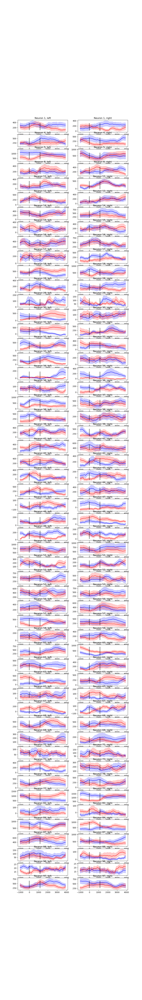

In [120]:


# Example DataFrames
# neuron_traces = pd.DataFrame(...)  # Your neuron traces data
# data = pd.DataFrame(...)  # Your laser event data

# Sample neuron to plot
#neuron_id = 2  # Adjust this based on the neuron you want to plot

# Time conversion
sampling_rate = 10  # Hz
pre_event_points = 1000 // (1000 / sampling_rate)  # 500 ms before
post_event_points = 4000 // (1000 / sampling_rate)  # 3000 ms after

# Function to extract data around laser event
def extract_data(side, prev_same, n_id):
    times = data[(data['side'] == side) & (data['prev_same'] == prev_same) & (data['choice_made'] == side)]['tone_ts']
    indices = (times * sampling_rate / 1000).astype(int)
    traces = []
    for idx in indices:
        start = int(idx - pre_event_points)
        end = int( idx + post_event_points)
        if start > 500 & end < neuron_traces.shape[1]-1:
            trace = neuron_traces[n_id, start:end]
            if trace.shape[0] == pre_event_points + post_event_points:
                traces.append(trace)
    return np.array(traces)


def plot_neu(neuron_id, ax_n):
    # Left side
    side = 1
    traces_L_same = extract_data(side, True, neuron_id)
    traces_L_diff = extract_data(side, False, neuron_id)
    # Mean and std
    mean_trace_L_same = np.mean(traces_L_same, axis=0)
    std_trace_L_same = sem(traces_L_same, axis=0)
    mean_trace_L_diff = np.mean(traces_L_diff, axis=0)
    std_trace_L_diff = sem(traces_L_diff, axis=0)

    # Plot 
    axs[ax_n,0].plot(time_points, mean_trace_L_same, color='b', label='Same')
    axs[ax_n,0].fill_between(time_points, mean_trace_L_same - std_trace_L_same, mean_trace_L_same + std_trace_L_same, color='b', alpha=0.2)
    axs[ax_n,0].plot(time_points, mean_trace_L_diff, color='r', label='Diff')
    axs[ax_n,0].fill_between(time_points, mean_trace_L_diff - std_trace_L_diff, mean_trace_L_diff + std_trace_L_diff, color='r', alpha=0.2)
    axs[ax_n,0].set_title('Neuron '+ str(neuron_id) + ', left')

        # Lines at start tone, start response
    min_v = np.amin([np.amin(mean_trace_L_same), np.amin(mean_trace_L_diff)])
    max_v = np.amax([np.amax(mean_trace_L_same), np.amax(mean_trace_L_diff)])
    axs[ax_n,0].plot([0,0], [min_v, max_v], color='k', label='tone')
    axs[ax_n,0].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')
    
    # Right side
    side = -1
    traces_L_same = extract_data(side, True, neuron_id)
    traces_L_diff = extract_data(side, False, neuron_id)
    # Mean and std
    mean_trace_L_same = np.mean(traces_L_same, axis=0)
    std_trace_L_same = sem(traces_L_same, axis=0)
    mean_trace_L_diff = np.mean(traces_L_diff, axis=0)
    std_trace_L_diff = sem(traces_L_diff, axis=0)

    # Plot 
    axs[ax_n,1].plot(time_points, mean_trace_L_same, color='b', label='Same')
    axs[ax_n,1].fill_between(time_points, mean_trace_L_same - std_trace_L_same, mean_trace_L_same + std_trace_L_same, color='b', alpha=0.2)
    axs[ax_n,1].plot(time_points, mean_trace_L_diff, color='r', label='Diff')
    axs[ax_n,1].fill_between(time_points, mean_trace_L_diff - std_trace_L_diff, mean_trace_L_diff + std_trace_L_diff, color='r', alpha=0.2)
    axs[ax_n,1].set_title('Neuron '+ str(neuron_id) + ', right')
            # Lines at start tone, start response
    min_v = np.amin([np.amin(mean_trace_L_same), np.amin(mean_trace_L_diff)])
    max_v = np.amax([np.amax(mean_trace_L_same), np.amax(mean_trace_L_diff)])
    axs[ax_n,1].plot([0,0], [min_v, max_v], color='k', label='tone')
    axs[ax_n,1].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')



# Time points for x-axis
time_points = np.arange(-pre_event_points, post_event_points) * (1000 / sampling_rate)

# Plotting

fig, axs = plt.subplots(len(relevant_neu), 2, figsize=(10, 70))

for n in np.arange(len(relevant_neu)):
    plot_neu(relevant_neu[n], n)

plt.show()

# Now, olny errors

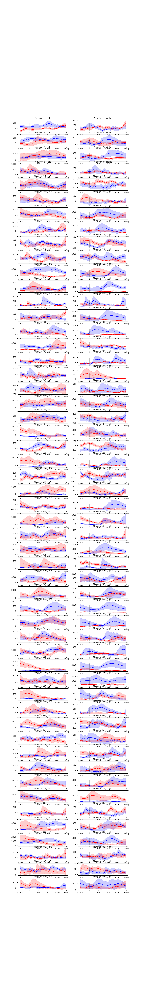

In [121]:


# Example DataFrames
# neuron_traces = pd.DataFrame(...)  # Your neuron traces data
# data = pd.DataFrame(...)  # Your laser event data

# Sample neuron to plot
#neuron_id = 2  # Adjust this based on the neuron you want to plot

# Time conversion
sampling_rate = 10  # Hz
pre_event_points = 1000 // (1000 / sampling_rate)  # 500 ms before
post_event_points = 4000 // (1000 / sampling_rate)  # 3000 ms after

# Function to extract data around laser event
def extract_data(side, prev_same, n_id):
    times = data[(data['side'] == side) & (data['prev_same'] == prev_same) & (data['choice_made'] == -side)]['tone_ts']
    indices = (times * sampling_rate / 1000).astype(int)
    traces = []
    for idx in indices:
        start = int(idx - pre_event_points)
        end = int( idx + post_event_points)
        if start > 500 & end < neuron_traces.shape[1]-1:
            trace = neuron_traces[n_id, start:end]
            if trace.shape[0] == pre_event_points + post_event_points:
                traces.append(trace)
    return np.array(traces)


def plot_neu(neuron_id, ax_n):
    # Left side
    side = 1
    traces_L_same = extract_data(side, True, neuron_id)
    traces_L_diff = extract_data(side, False, neuron_id)
    # Mean and std
    mean_trace_L_same = np.mean(traces_L_same, axis=0)
    std_trace_L_same = sem(traces_L_same, axis=0)
    mean_trace_L_diff = np.mean(traces_L_diff, axis=0)
    std_trace_L_diff = sem(traces_L_diff, axis=0)

    # Plot 
    axs[ax_n,0].plot(time_points, mean_trace_L_same, color='b', label='Same')
    axs[ax_n,0].fill_between(time_points, mean_trace_L_same - std_trace_L_same, mean_trace_L_same + std_trace_L_same, color='b', alpha=0.2)
    axs[ax_n,0].plot(time_points, mean_trace_L_diff, color='r', label='Diff')
    axs[ax_n,0].fill_between(time_points, mean_trace_L_diff - std_trace_L_diff, mean_trace_L_diff + std_trace_L_diff, color='r', alpha=0.2)
    axs[ax_n,0].set_title('Neuron '+ str(neuron_id) + ', left')

        # Lines at start tone, start response
    min_v = np.amin([np.amin(mean_trace_L_same), np.amin(mean_trace_L_diff)])
    max_v = np.amax([np.amax(mean_trace_L_same), np.amax(mean_trace_L_diff)])
    axs[ax_n,0].plot([0,0], [min_v, max_v], color='k', label='tone')
    axs[ax_n,0].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')
    
    # Right side
    side = -1
    traces_L_same = extract_data(side, True, neuron_id)
    traces_L_diff = extract_data(side, False, neuron_id)
    # Mean and std
    mean_trace_L_same = np.mean(traces_L_same, axis=0)
    std_trace_L_same = sem(traces_L_same, axis=0)
    mean_trace_L_diff = np.mean(traces_L_diff, axis=0)
    std_trace_L_diff = sem(traces_L_diff, axis=0)

    # Plot 
    axs[ax_n,1].plot(time_points, mean_trace_L_same, color='b', label='Same')
    axs[ax_n,1].fill_between(time_points, mean_trace_L_same - std_trace_L_same, mean_trace_L_same + std_trace_L_same, color='b', alpha=0.2)
    axs[ax_n,1].plot(time_points, mean_trace_L_diff, color='r', label='Diff')
    axs[ax_n,1].fill_between(time_points, mean_trace_L_diff - std_trace_L_diff, mean_trace_L_diff + std_trace_L_diff, color='r', alpha=0.2)
    axs[ax_n,1].set_title('Neuron '+ str(neuron_id) + ', right')
            # Lines at start tone, start response
    min_v = np.amin([np.amin(mean_trace_L_same), np.amin(mean_trace_L_diff)])
    max_v = np.amax([np.amax(mean_trace_L_same), np.amax(mean_trace_L_diff)])
    axs[ax_n,1].plot([0,0], [min_v, max_v], color='k', label='tone')
    axs[ax_n,1].plot([1150,1150], [min_v, max_v], color='k', label='RESPONSE')



# Time points for x-axis
time_points = np.arange(-pre_event_points, post_event_points) * (1000 / sampling_rate)

# Plotting

fig, axs = plt.subplots(len(relevant_neu), 2, figsize=(10, 70))

for n in np.arange(len(relevant_neu)):
    plot_neu(relevant_neu[n], n)

plt.show()

In [130]:
data[(data['choice_made']==-1) & (data['side']==1)].shape

(20, 6)

correct 
left: 120; right: 110
error
left: 20; right: 17

